# PastureBase Ireland

<https://pasturebase.teagasc.ie>

Hanrahan, L., Geoghegan, A., O'Donovan, M., Griffith, V., Ruelle, E.,
Wallace, M. and Shalloo, L. (2017). 'PastureBase Ireland: A grassland
decision support system and national database',
*Computers and Electronics in Agriculture*, vol. 136, pp. 193-201.
DOI: [10.1016/j.compag.2017.01.029][Hanrahan].

[Hanrahan]: https://doi.org/10.1016/j.compag.2017.01.029

In [1]:
import os
from datetime import datetime, timezone
import matplotlib.colors as mcolors
import matplotlib.pyplot as plt
from matplotlib.cbook import boxplot_stats
import numpy as np
import pandas as pd

In [2]:
print("Last updated:", datetime.now(tz=timezone.utc))

Last updated: 2023-03-06 11:31:59.090667+00:00


In [3]:
DATA_DIR = os.path.join(
    "data", "grass_growth", "pasturebase", "GrowthRateAveragebyWeek.csv"
)

In [5]:
grass_ts = pd.read_csv(DATA_DIR)

In [6]:
grass_ts.head()

,Name,Counties_CountyID,Year,WeekNo,AvgGrowth
0,Antrim,1,2019,37,NaN
1,Armagh,2,2018,22,126.17
2,Armagh,2,2018,23,93.01
3,Armagh,2,2018,24,25.58
4,Armagh,2,2018,25,35.34


In [7]:
grass_ts.shape

(12455, 5)

In [8]:
list(grass_ts)

['Name', 'Counties_CountyID', 'Year', 'WeekNo', 'AvgGrowth']

In [9]:
grass_ts.sort_values(by=["Name", "Year", "WeekNo"], inplace=True)

In [10]:
# convert year and week number to timestamp
# (Monday as the first day of the week)
grass_ts["Timestamp"] = grass_ts.apply(
    lambda row: datetime.strptime(
        str(row.Year) + "-" + str(row.WeekNo) + "-1", "%G-%V-%u"
    ),
    axis=1
)

In [11]:
# create time series using counties as individual columns
grass_ts.drop(columns=["Counties_CountyID", "Year", "WeekNo"], inplace=True)

In [12]:
grass_ts = pd.pivot_table(
    grass_ts, values="AvgGrowth", index=["Timestamp"], columns=["Name"]
)

In [13]:
grass_ts.shape

(508, 30)

In [14]:
grass_ts["time"] = grass_ts.index

In [15]:
grass_ts.sort_values(by=["time"], inplace=True)

In [16]:
grass_ts.head()

Name,Armagh,Carlow,Cavan,Clare,Cork,Derry,Donegal,Down,Dublin,Galway,...,Offaly,Roscommon,Sligo,Tipperary,Tyrone,Waterford,Westmeath,Wexford,Wicklow,time
Timestamp,,,,,,,,,,,,,,,,,,,,,
2012-12-31,NaN,NaN,0.39,NaN,1.10,NaN,NaN,NaN,NaN,1.71,...,NaN,NaN,NaN,17.05,NaN,NaN,NaN,NaN,3.36,2012-12-31
2013-01-07,NaN,NaN,4.33,4.94,4.97,NaN,NaN,NaN,NaN,0.00,...,NaN,NaN,NaN,3.66,NaN,8.76,NaN,NaN,NaN,2013-01-07
2013-01-14,NaN,NaN,NaN,NaN,4.46,NaN,NaN,NaN,NaN,7.14,...,NaN,NaN,NaN,5.43,NaN,3.22,NaN,3.47,NaN,2013-01-14
2013-01-21,NaN,NaN,NaN,2.42,10.11,NaN,NaN,NaN,NaN,0.00,...,NaN,NaN,3.45,5.00,NaN,3.89,NaN,6.02,NaN,2013-01-21
2013-01-28,NaN,5.03,4.80,NaN,7.67,NaN,NaN,NaN,NaN,6.87,...,NaN,NaN,NaN,5.11,NaN,4.64,NaN,NaN,3.37,2013-01-28


In [17]:
# drop NI counties
grass_ts.drop(columns=["Armagh", "Derry", "Down", "Tyrone"], inplace=True)

In [18]:
# use weekly time series starting on Monday to fill missing rows
grass_ = pd.DataFrame(
    pd.date_range(
        str(grass_ts["time"][0].year) + "-01-01",
        str(grass_ts["time"][len(grass_ts) - 1].year) + "-12-31",
        freq="W-MON"
    ),
    columns=["time"]
)

In [19]:
grass_ts = pd.merge(grass_, grass_ts, how="outer")

In [20]:
grass_ts.index = grass_ts["time"]

In [21]:
grass_ts.drop(columns=["time"], inplace=True)

In [22]:
grass_ts.shape

(574, 26)

In [23]:
grass_ts.to_csv(
    os.path.join("data", "grass_growth", "pasturebase", "pasturebase.csv")
)

In [24]:
# new colour map
# https://stackoverflow.com/a/31052741
# sample the colormaps that you want to use. Use 15 from each so we get 30
# colors in total
colors1 = plt.cm.tab20b(np.linspace(0., 1, 15))
colors2 = plt.cm.tab20c(np.linspace(0, 1, 15))

# combine them and build a new colormap
colors = np.vstack((colors1, colors2))

## Distribution

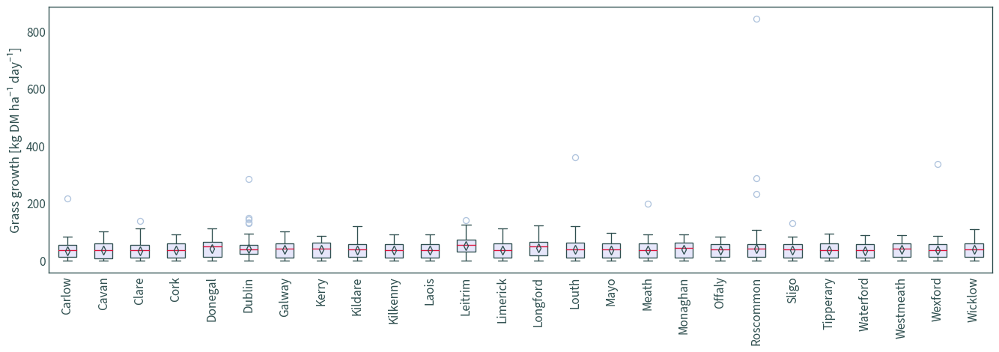

In [24]:
# with outliers
grass_ts.plot.box(
    figsize=(14, 5), showmeans=True, patch_artist=True,
    color={
        "medians": "Crimson",
        "whiskers": "DarkSlateGrey",
        "caps": "DarkSlateGrey"
    },
    boxprops={"facecolor": "Lavender", "color": "DarkSlateGrey"},
    meanprops={
        "markeredgecolor": "DarkSlateGrey",
        "marker": "d",
        "markerfacecolor": (1, 1, 0, 0)  # transparent
    },
    flierprops={"markeredgecolor": "LightSteelBlue", "zorder": 1}
)
plt.xticks(rotation="vertical")
plt.ylabel("Grass growth [kg DM ha⁻¹ day⁻¹]")
plt.tight_layout()
# plt.savefig(os.path.join("data", "grass_growth", "pasturebase", "boxplot_outliers.png"))
plt.show()

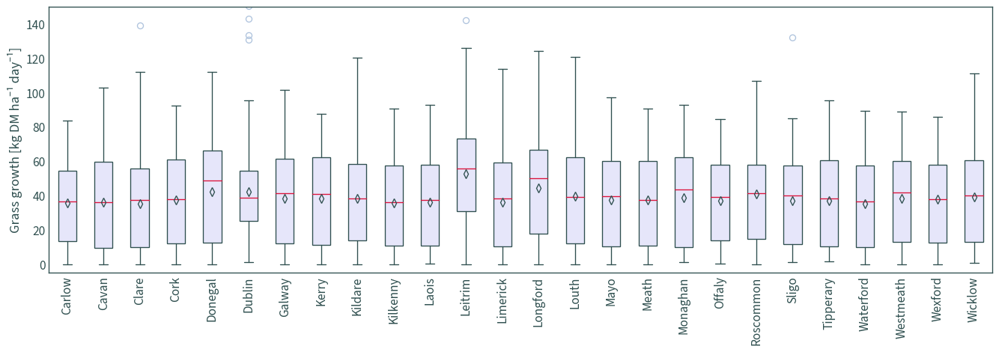

In [25]:
# with outliers
grass_ts.plot.box(
    figsize=(14, 5), showmeans=True, patch_artist=True, ylim=[-5.0, 150.0],
    color={
        "medians": "Crimson",
        "whiskers": "DarkSlateGrey",
        "caps": "DarkSlateGrey"
    },
    boxprops={"facecolor": "Lavender", "color": "DarkSlateGrey"},
    meanprops={
        "markeredgecolor": "DarkSlateGrey",
        "marker": "d",
        "markerfacecolor": (1, 1, 0, 0)  # transparent
    },
    flierprops={"markeredgecolor": "LightSteelBlue", "zorder": 1}
)
plt.xticks(rotation="vertical")
plt.ylabel("Grass growth [kg DM ha⁻¹ day⁻¹]")
plt.tight_layout()
# plt.savefig(os.path.join("data", "grass_growth", "pasturebase", "boxplot_outliers.png"))
plt.show()

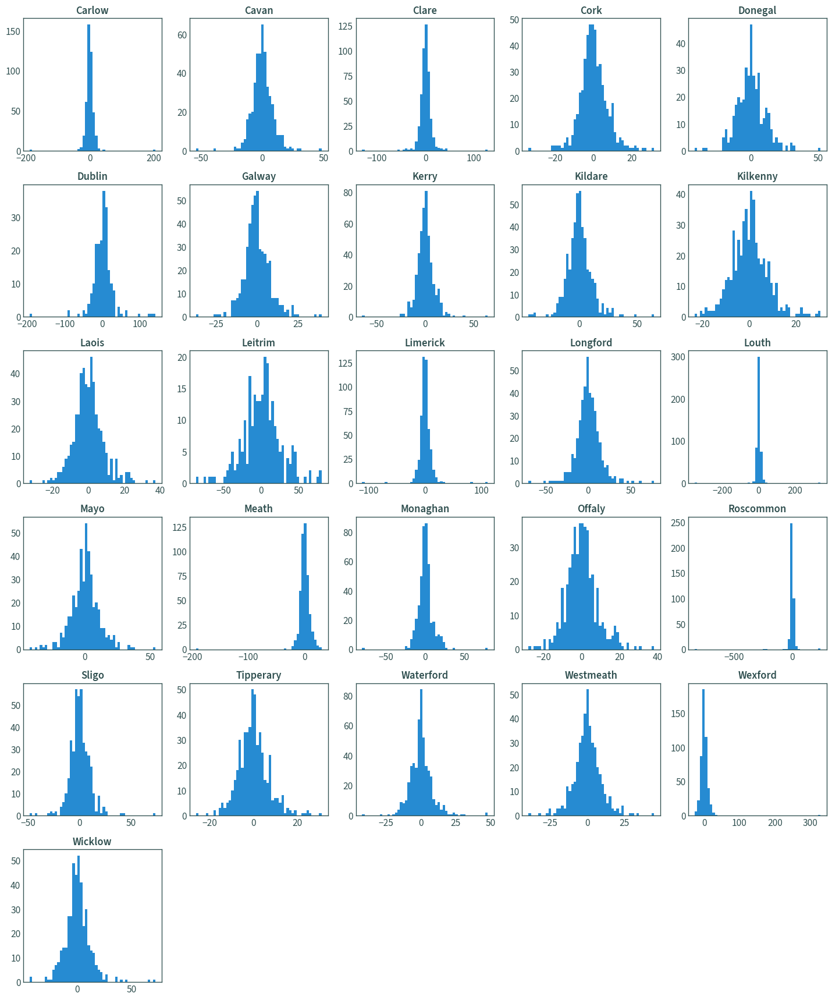

In [26]:
grass_ts.diff().hist(figsize=(15, 18), bins=50, grid=False)
plt.tight_layout()
# plt.savefig(os.path.join("data", "grass_growth", "pasturebase", "diff_hist_outliers.png"))
plt.show()

## Time series

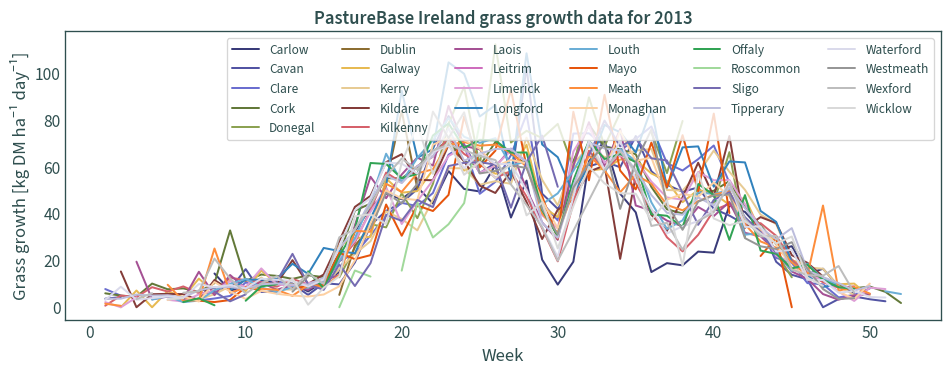

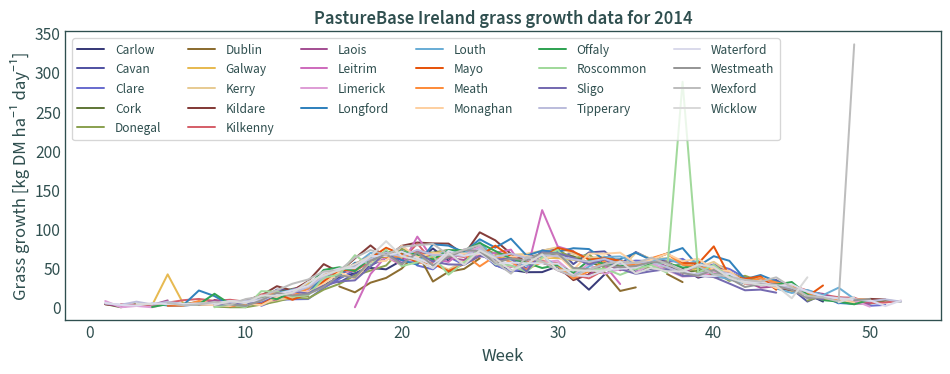

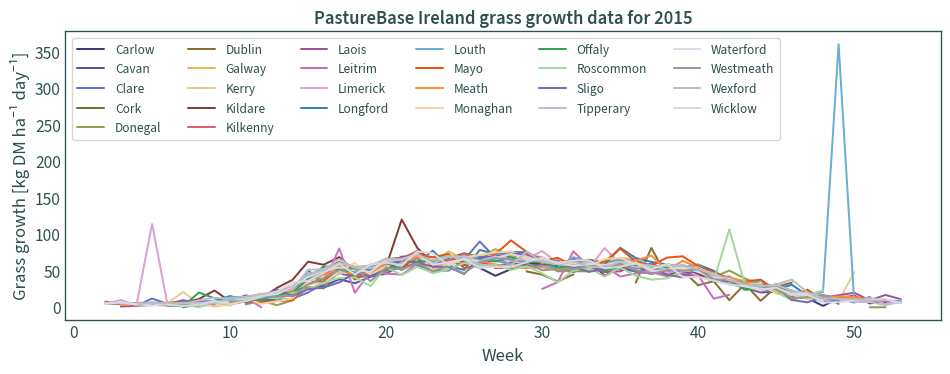

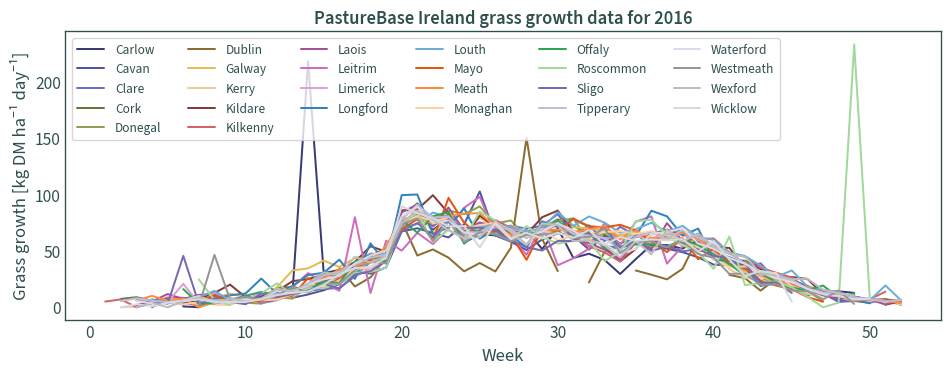

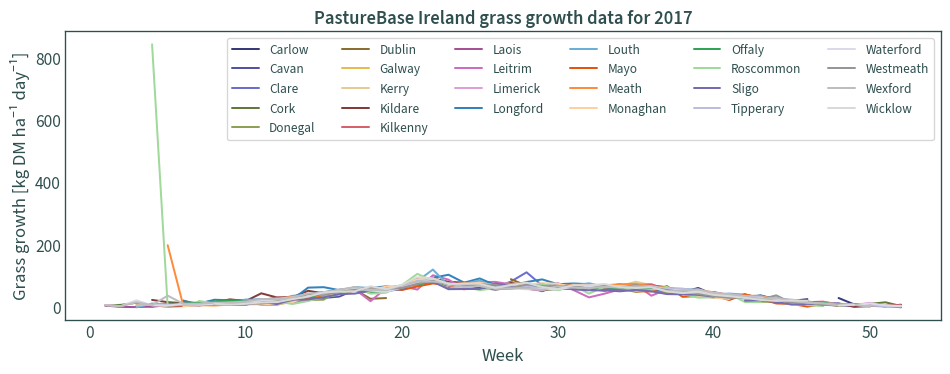

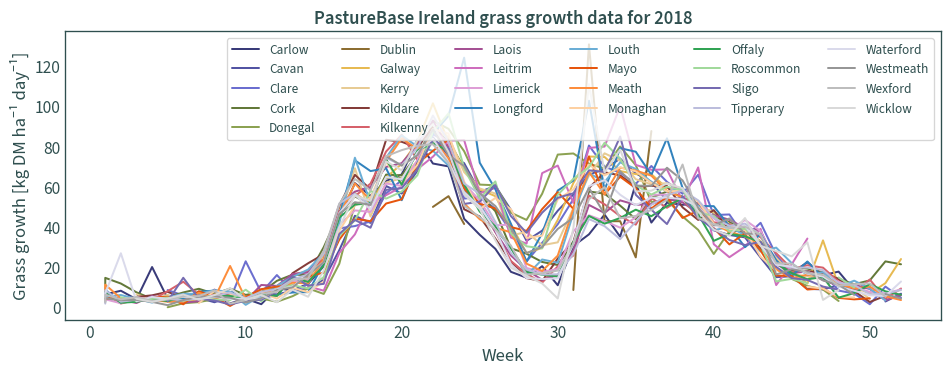

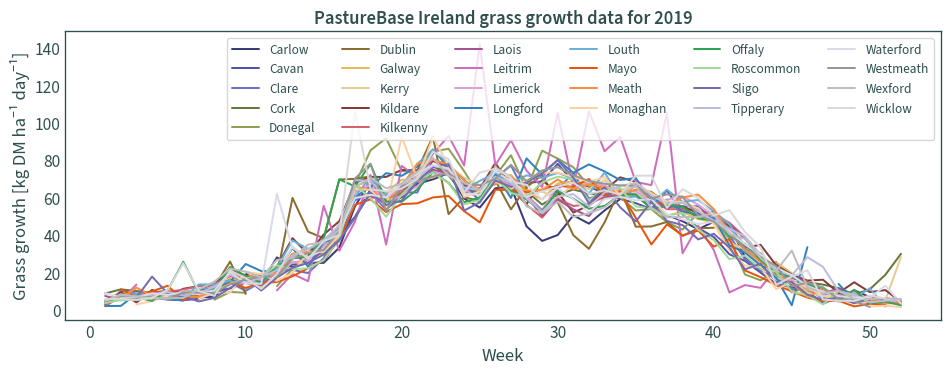

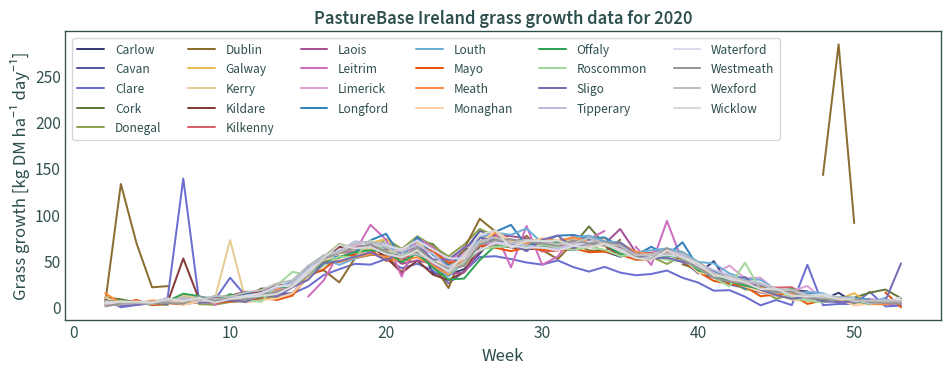

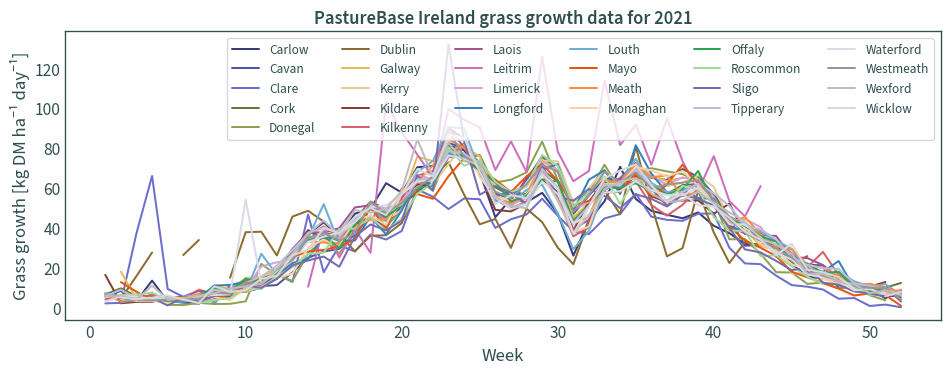

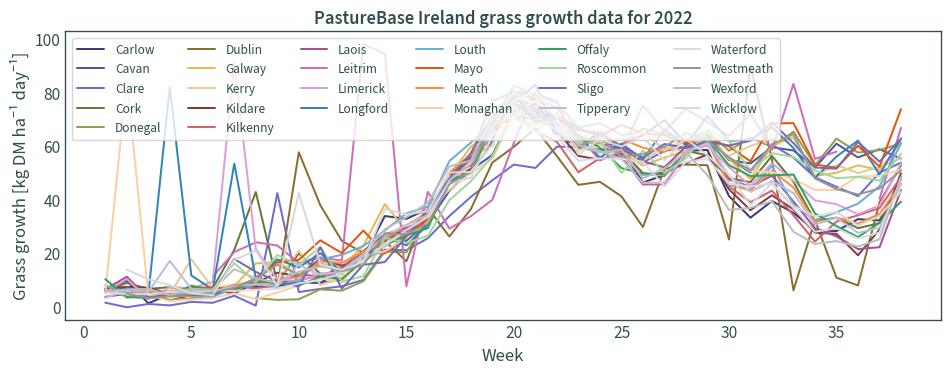

In [27]:
years = list(grass_ts.index.year.unique())
for y in years:
    if y > 2012:
        grass_ts.loc[str(y)].set_index(
            grass_ts.loc[str(y)].index.isocalendar().week
        ).sort_index().plot(
            figsize=(10, 4), xlabel="Week",
            ylabel="Grass growth [kg DM ha⁻¹ day⁻¹]",
            cmap=mcolors.ListedColormap(colors)
        )
        plt.title(f"PastureBase Ireland grass growth data for {y}")
        plt.legend(ncol=6)
        plt.tight_layout()
        plt.show()

In [23]:
counties = list(grass_ts)

In [29]:
# pivot table for plotting
grass_piv = grass_ts.copy()
grass_piv["year"] = grass_piv.index.year
grass_piv["weekno"] = grass_piv.index.isocalendar().week
grass_piv = pd.pivot_table(grass_piv, index="weekno", columns="year")

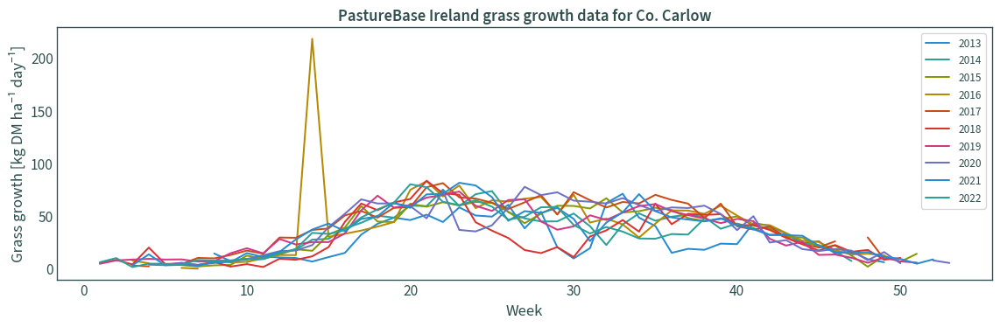

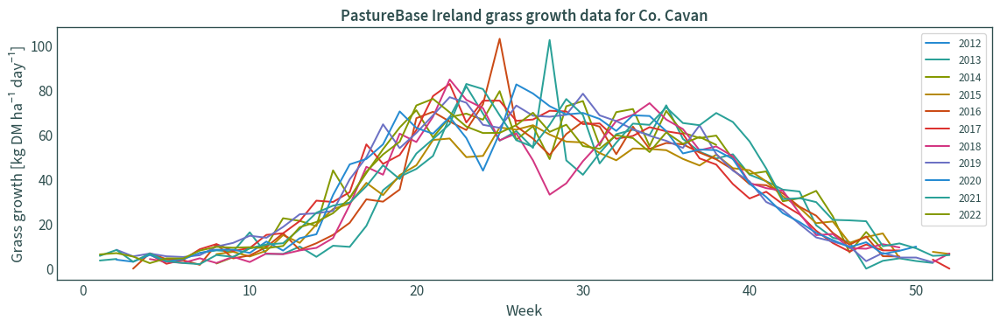

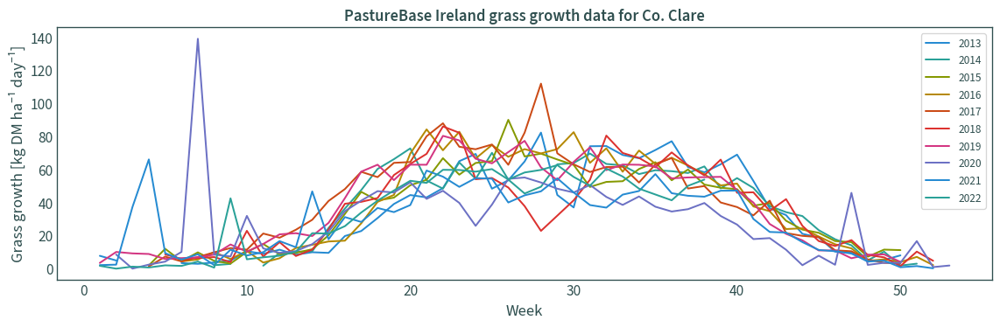

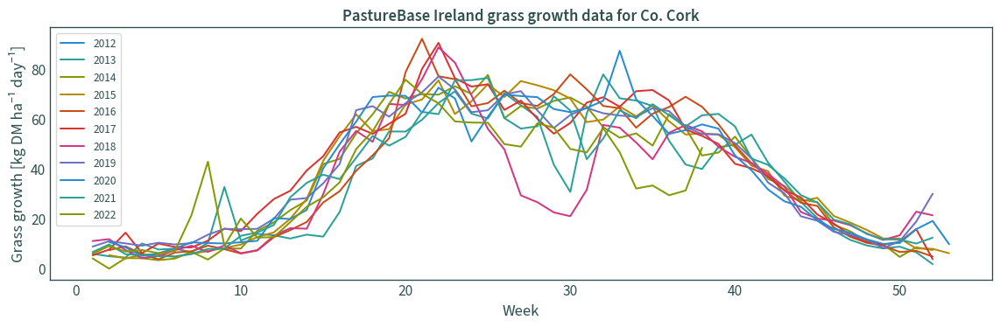

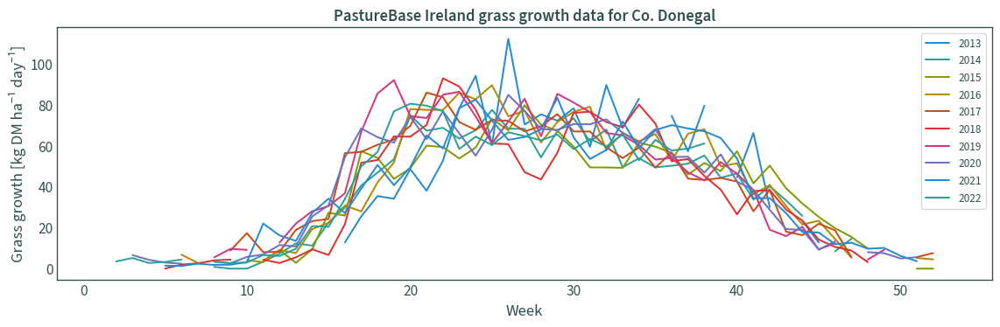

...

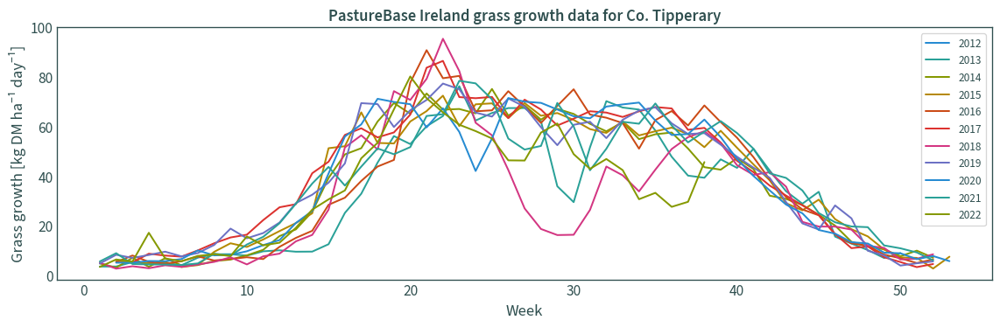

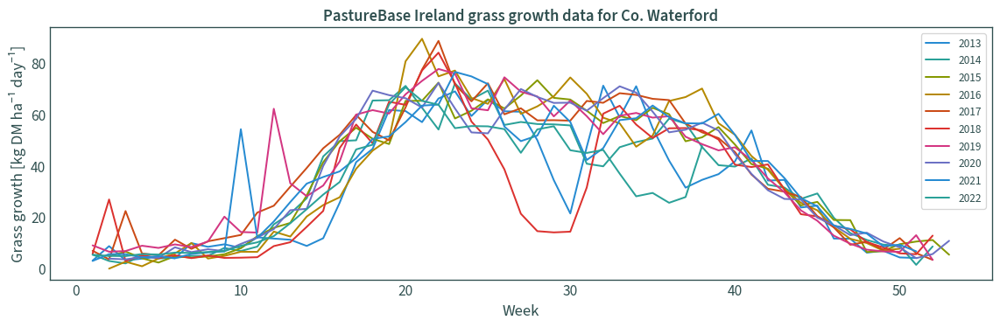

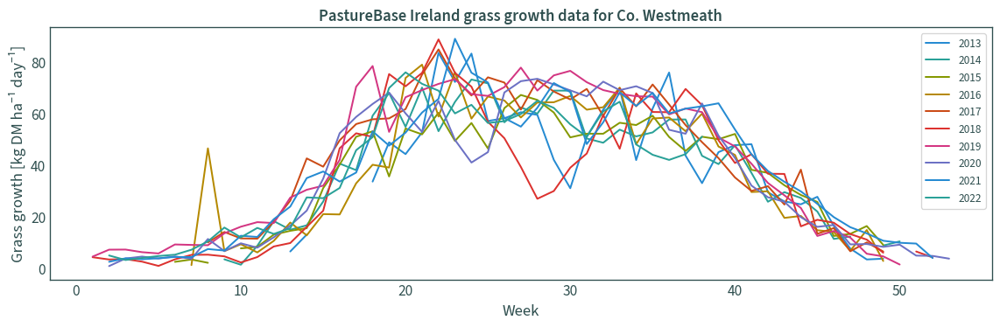

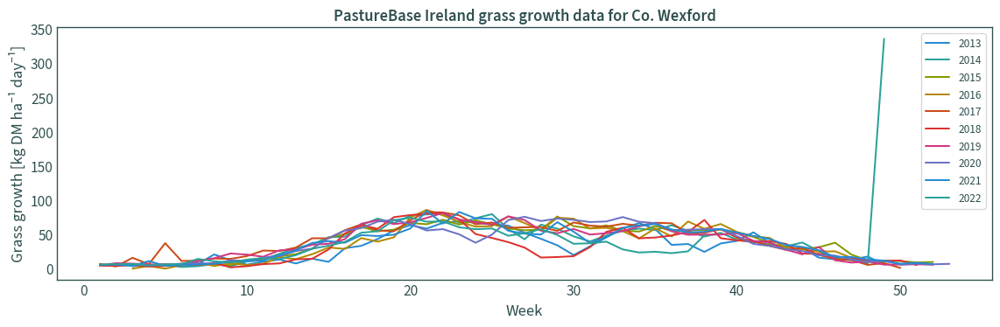

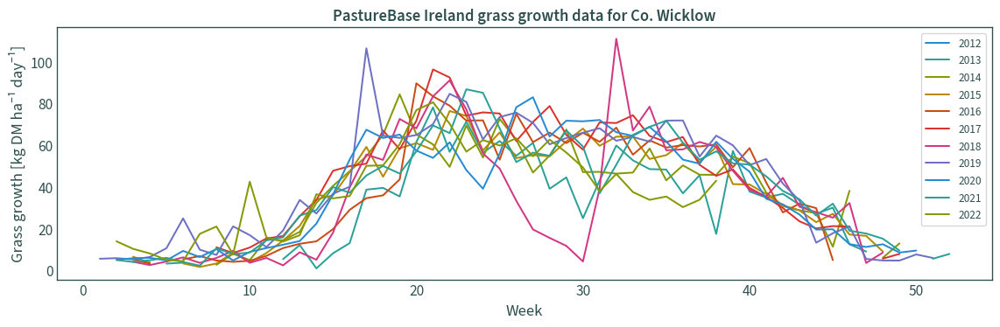

In [30]:
for county in counties:
    grass_piv[county].plot(
        figsize=(12, 4), xlabel="Week",
        ylabel="Grass growth [kg DM ha⁻¹ day⁻¹]"
    )
    plt.title(f"PastureBase Ireland grass growth data for Co. {county}")
    plt.legend(title=None)
    plt.tight_layout()
    plt.show()

## Filtering outliers in distribution

In [31]:
grass_out = grass_ts.copy()
for col in counties:
    grass_out[[col]] = grass_out[[col]].replace(
        list(boxplot_stats(grass_out[[col]].dropna())[0]["fliers"]), np.nan
    )

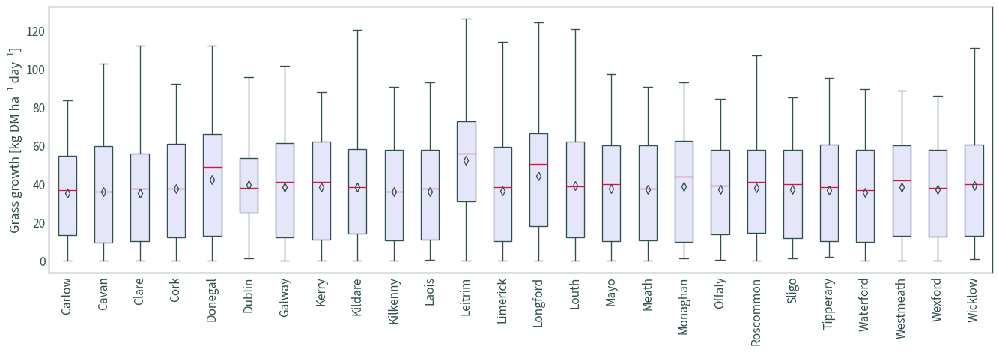

In [32]:
grass_out.plot.box(
    figsize=(14, 5), showmeans=True, patch_artist=True,
    color={
        "medians": "Crimson",
        "whiskers": "DarkSlateGrey",
        "caps": "DarkSlateGrey"
    },
    boxprops={"facecolor": "Lavender", "color": "DarkSlateGrey"},
    meanprops={
        "markeredgecolor": "DarkSlateGrey",
        "marker": "d",
        "markerfacecolor": (1, 1, 0, 0)  # transparent
    },
    flierprops={"markeredgecolor": "LightSteelBlue", "zorder": 1}
)
plt.xticks(rotation="vertical")
plt.ylabel("Grass growth [kg DM ha⁻¹ day⁻¹]")
plt.tight_layout()
# plt.savefig(os.path.join("data", "grass_growth", "pasturebase", "boxplot.png"))
plt.show()

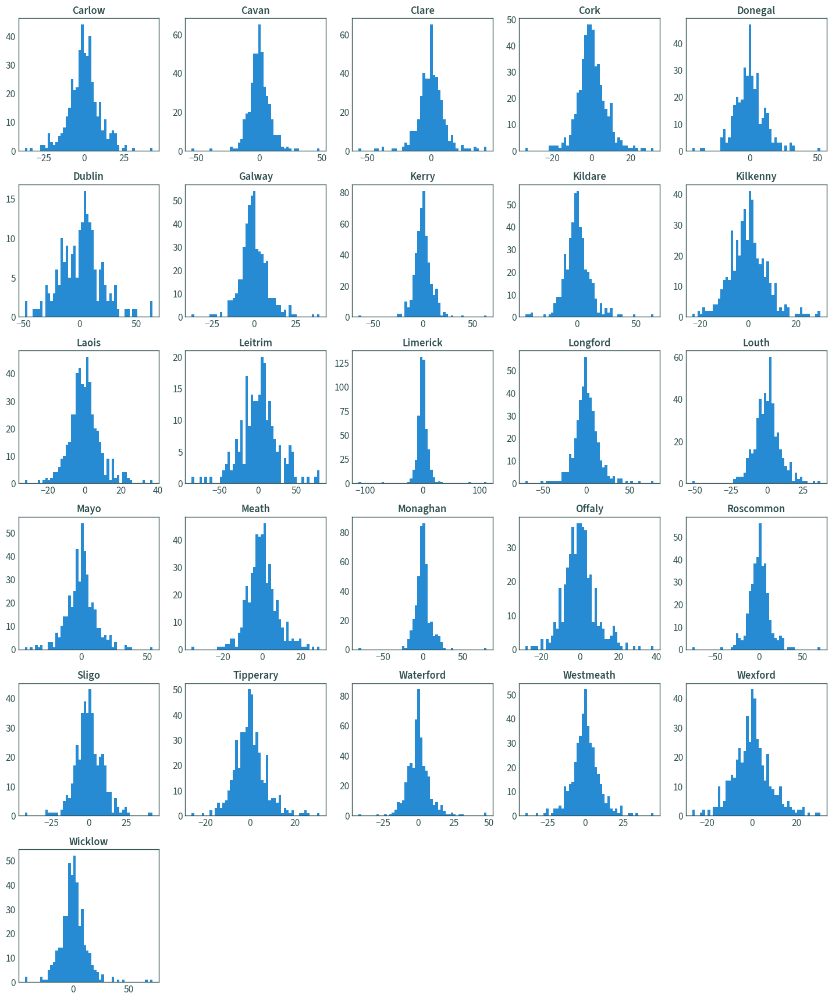

In [33]:
grass_out.diff().hist(figsize=(15, 18), bins=50, grid=False)
plt.tight_layout()
# plt.savefig(os.path.join("data", "grass_growth", "pasturebase", "diff_hist.png"))
plt.show()

## Filtering outliers using 3-week moving average

In [98]:
grass_out = grass_ts.reset_index()

In [99]:
for county in counties:
    mn = grass_out.rolling(3, center=True, on="time")[county].median()
    # mn = grass_out.rolling(3, center=True, on="time")[county].mean()
    # sd = grass_out.rolling(3, center=True, on="time")[county].std()
    grass_out[f"{county}_outlier"] = (
        grass_out[county].sub(mn).abs().gt(25)
    )
    grass_out[f"{county}_mn"] = mn
    # grass_out[f"{county}_sd"] = sd
    # grass_out[f"{county}_f"] = np.nan
    # grass_out[f"{county}_f"] = grass_out[
    #     (
    #         grass_out[county] <=
    #         grass_out[f"{county}_mn"] + 2 * grass_out[f"{county}_sd"]
    #     ) & (
    #         grass_out[county] >=
    #         grass_out[f"{county}_mn"] - 2 * grass_out[f"{county}_sd"]
    #     )
    # ][[county]]
    # grass_out[f"{county}_f"] = grass_out[
    #     grass_out[f"{county}_f"].isna()
    # ][[county]]

In [100]:
grass_out.set_index("time", inplace=True)

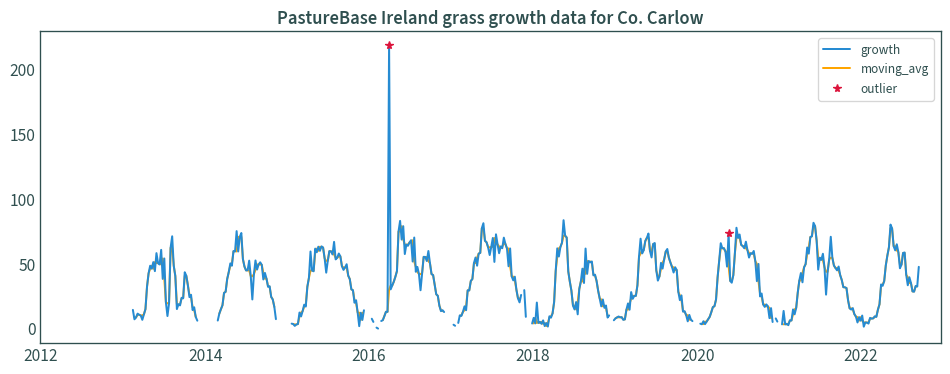

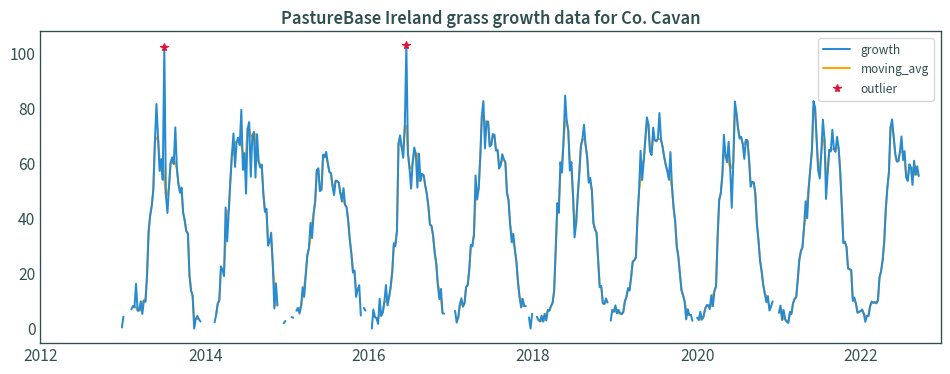

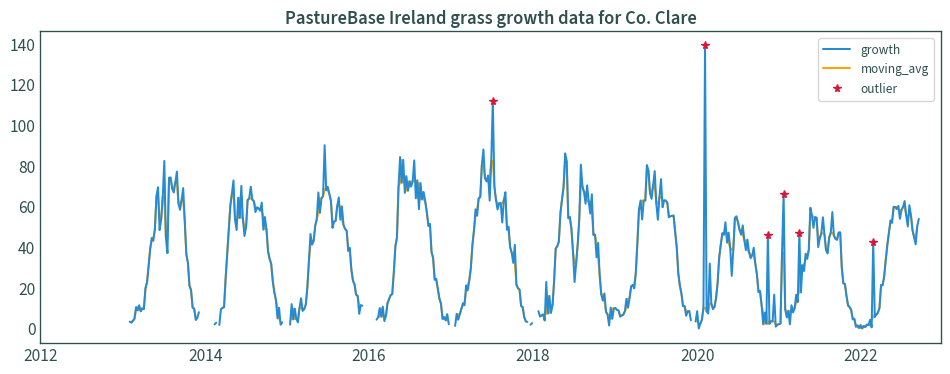

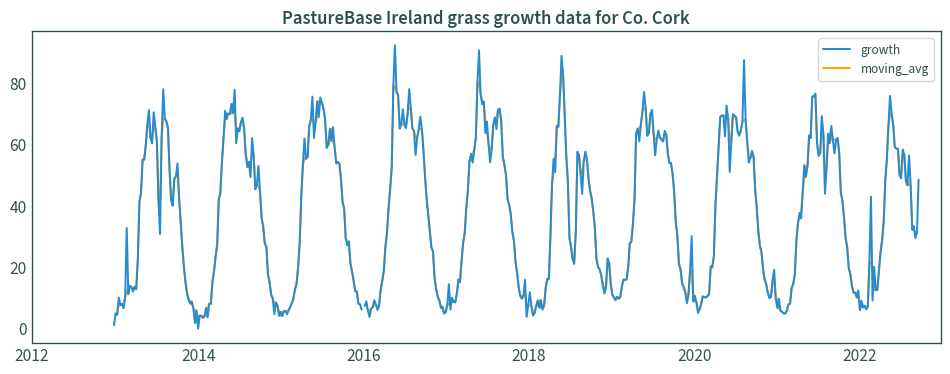

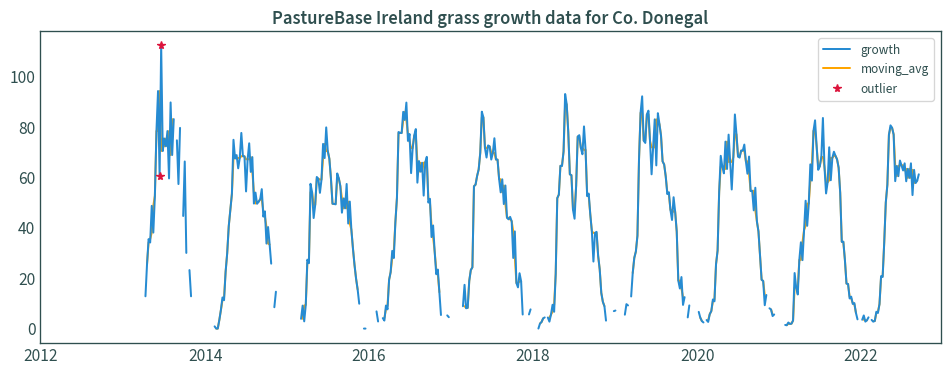

...

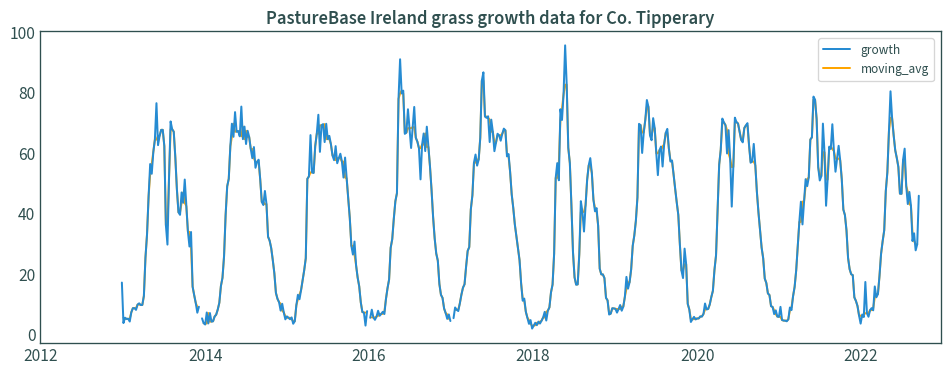

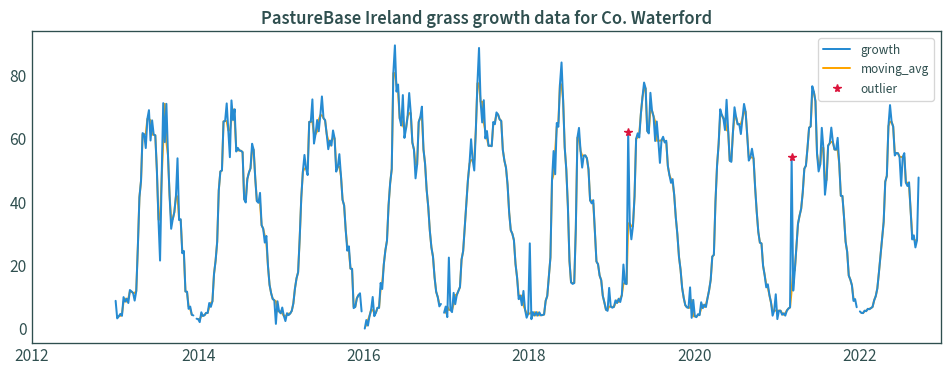

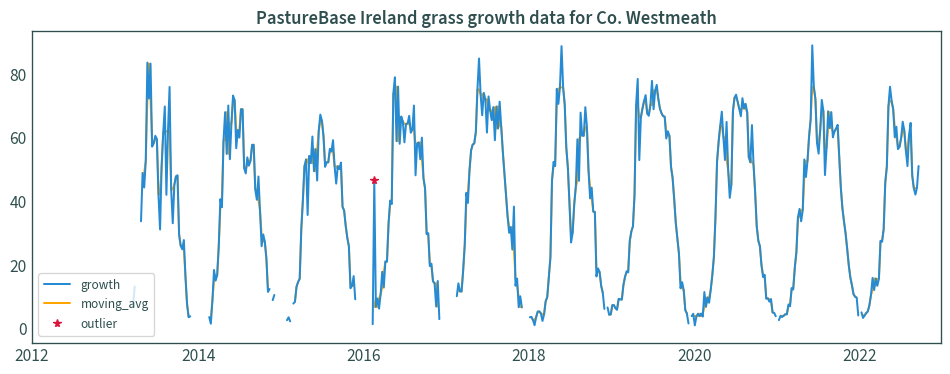

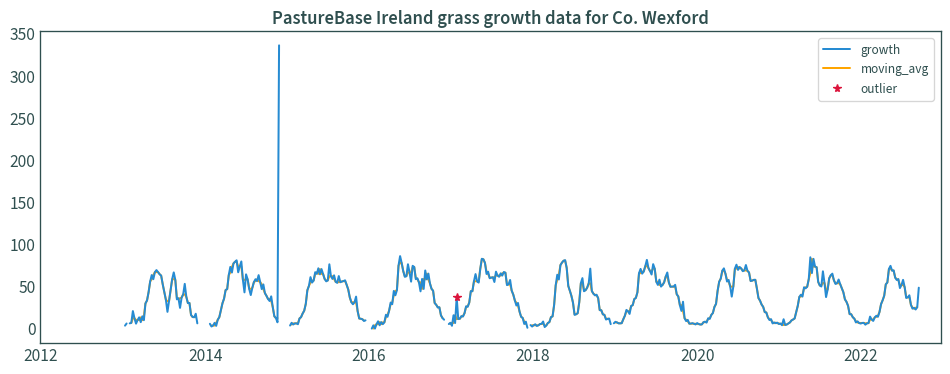

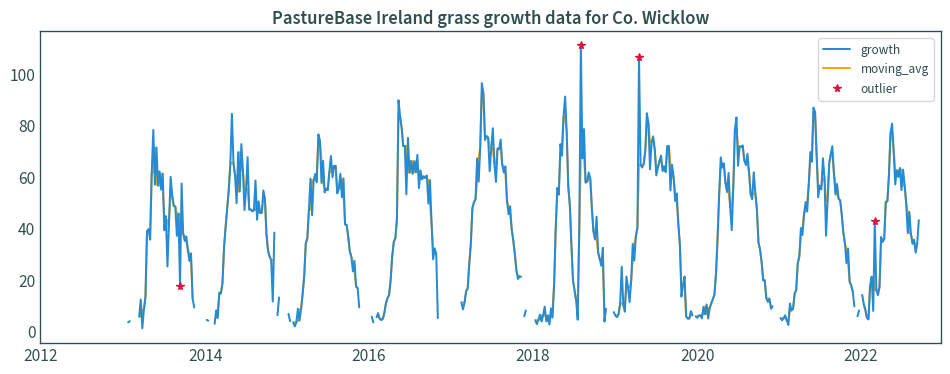

In [101]:
for county in counties:
    axs = grass_out.plot(
        # ylim=[0.0, 200.0],
        figsize=(10, 4), y=county, label="growth"
    )
    grass_out.plot(
        figsize=(10, 4), y=f"{county}_mn", ax=axs, label="moving_avg",
        color="orange", zorder=1
    )
    # grass_out.plot(
    #     figsize=(10, 4), y=f"{county}_f", ax=axs, label="f",
    #     color="purple", linewidth=0.0, marker="*"
    # )
    if True in list(grass_out[f"{county}_outlier"].unique()):
        grass_out[grass_out[f"{county}_outlier"] == True].plot(
            ax=axs, linewidth=0.0, marker="*", y=county, label="outlier",
            color="crimson"
        )
    plt.title(f"PastureBase Ireland grass growth data for Co. {county}")
    plt.xlabel("")
    plt.tight_layout()
    plt.show()

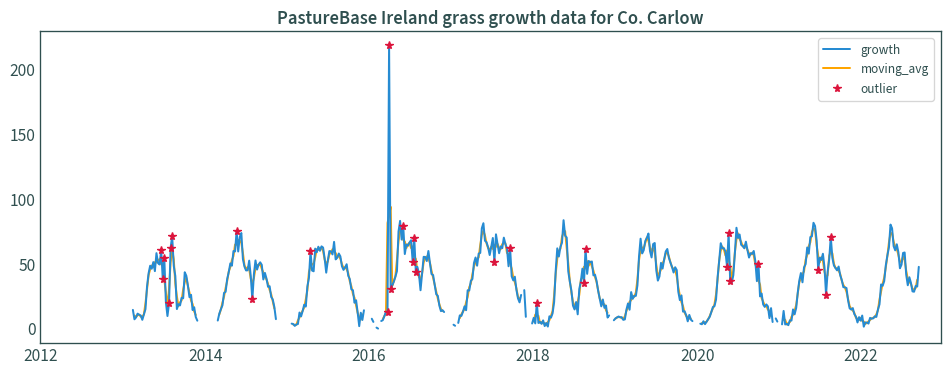

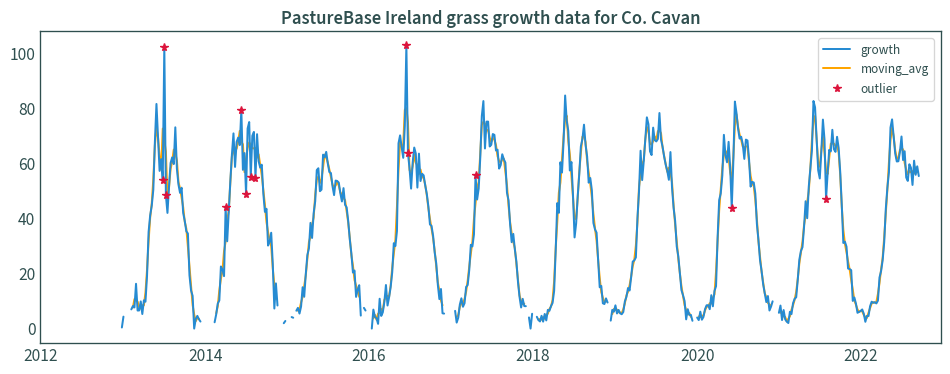

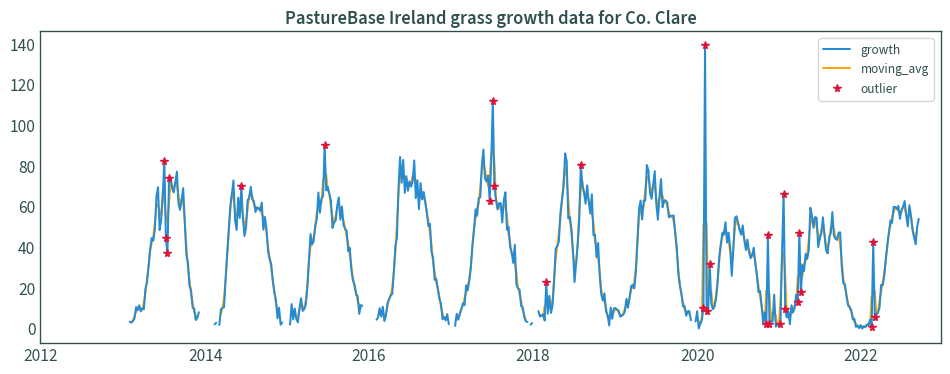

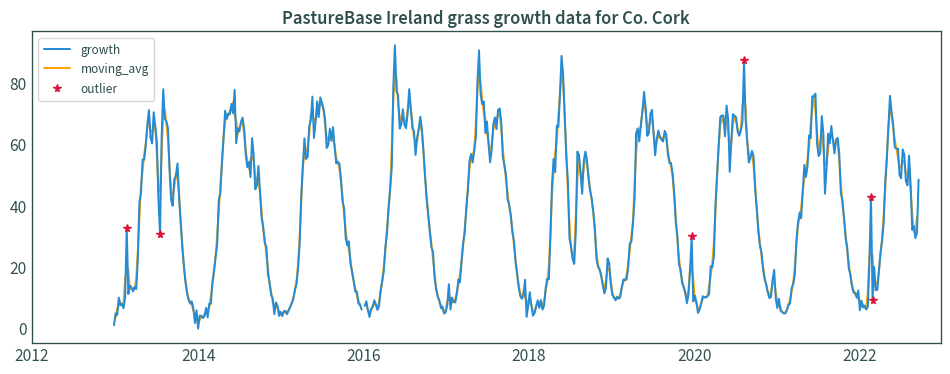

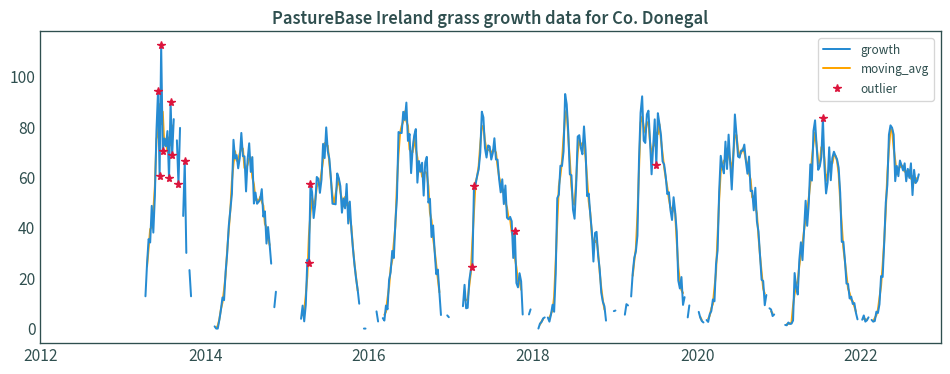

...

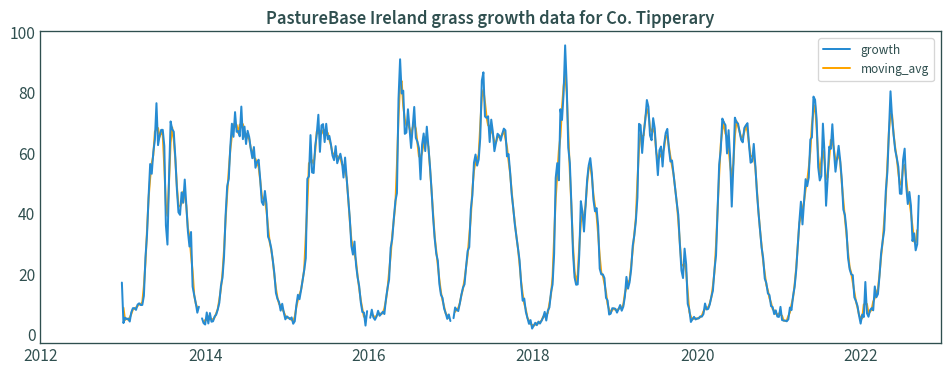

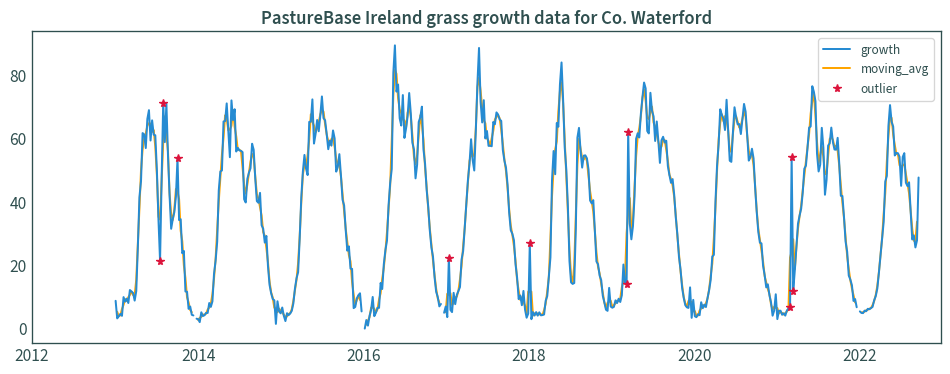

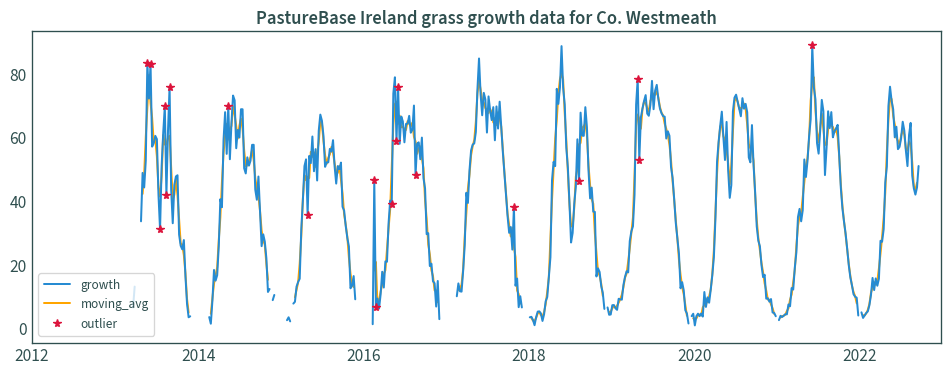

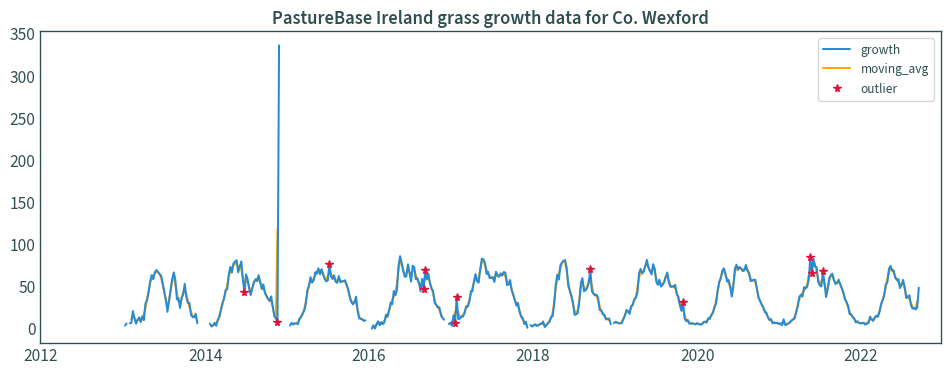

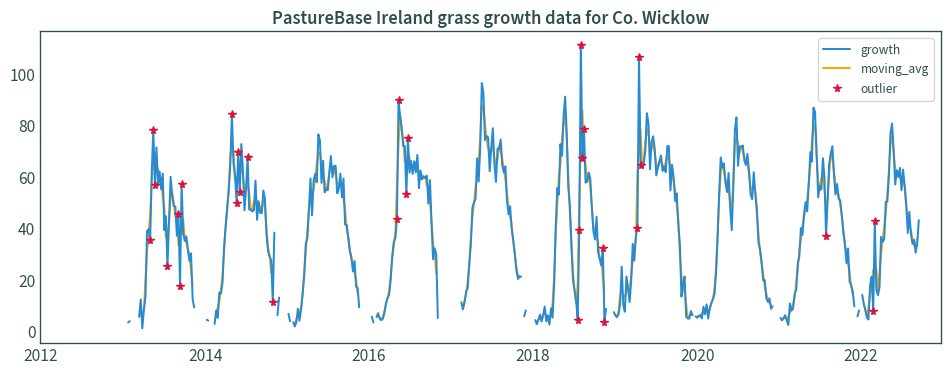

In [37]:
for county in counties:
    axs = grass_out.plot(
        # ylim=[0.0, 200.0],
        figsize=(10, 4), y=county, label="growth"
    )
    grass_out.plot(
        figsize=(10, 4), y=f"{county}_mn", ax=axs, label="moving_avg",
        color="orange", zorder=1
    )
    if True in list(grass_out[f"{county}_outlier"].unique()):
        grass_out[grass_out[f"{county}_outlier"] == True].plot(
            ax=axs, linewidth=0.0, marker="*", y=county, label="outlier",
            color="crimson"
        )
    plt.title(f"PastureBase Ireland grass growth data for Co. {county}")
    plt.xlabel("")
    plt.tight_layout()
    plt.show()

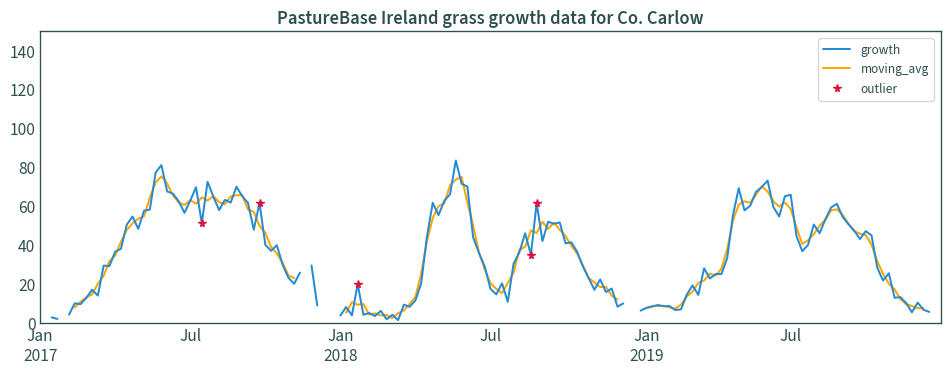

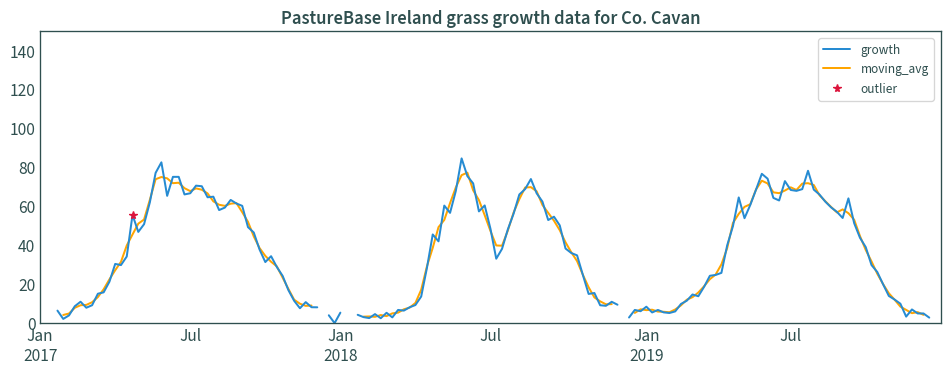

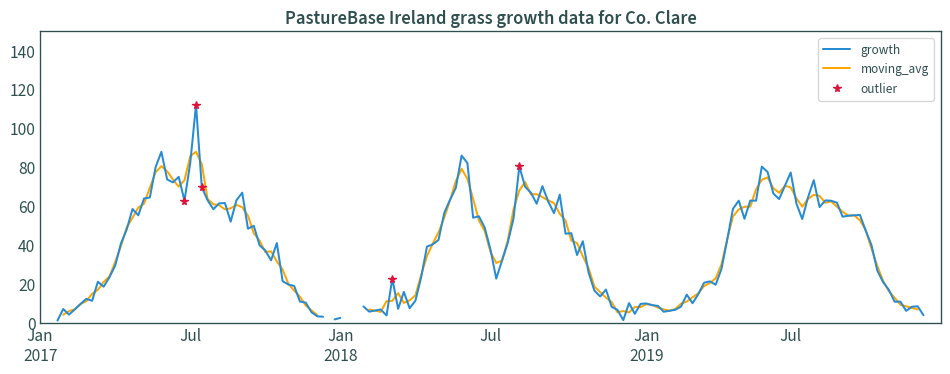

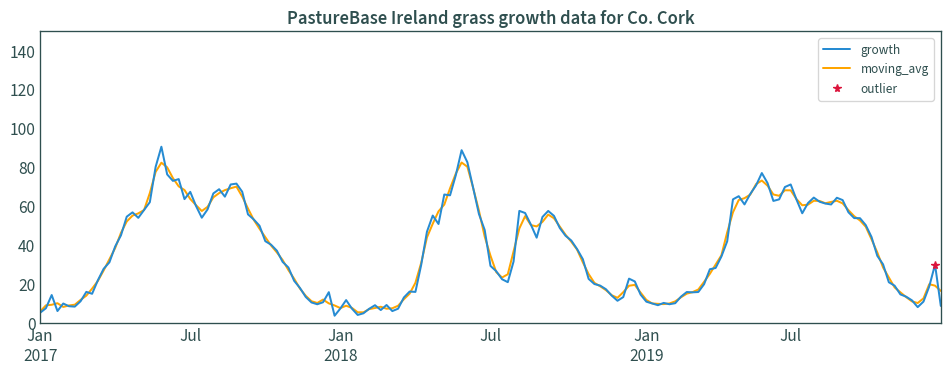

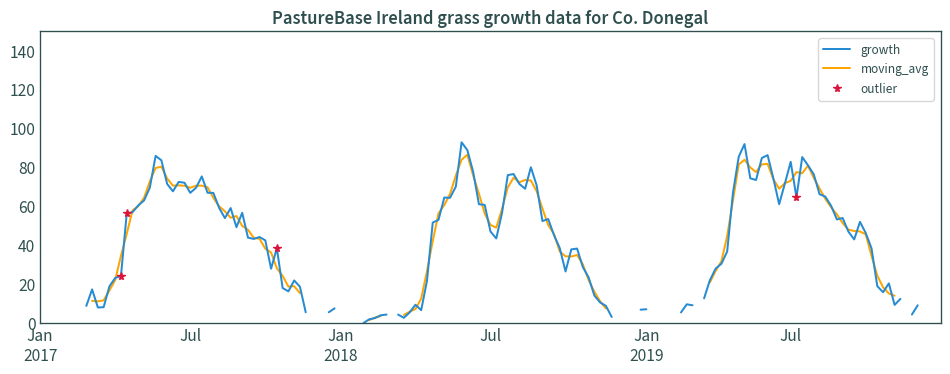

...

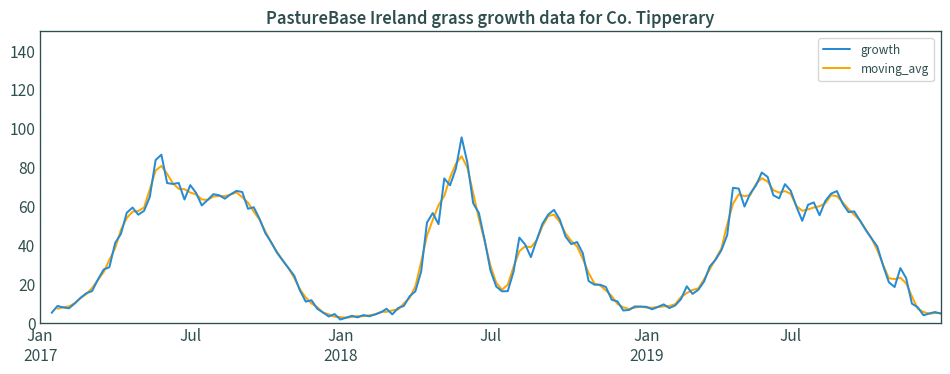

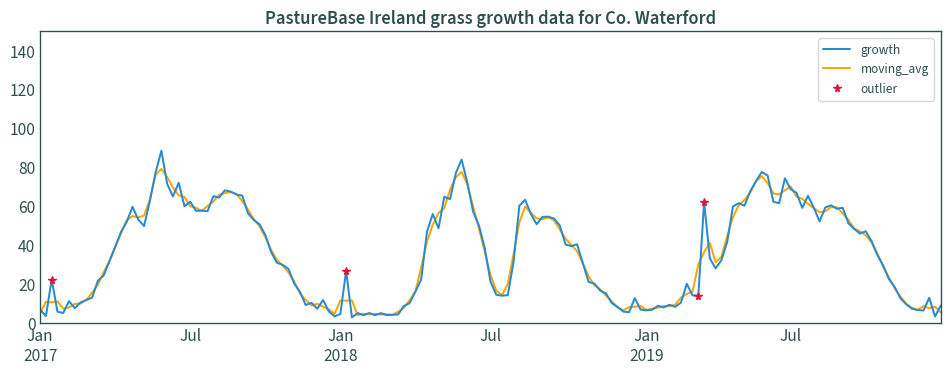

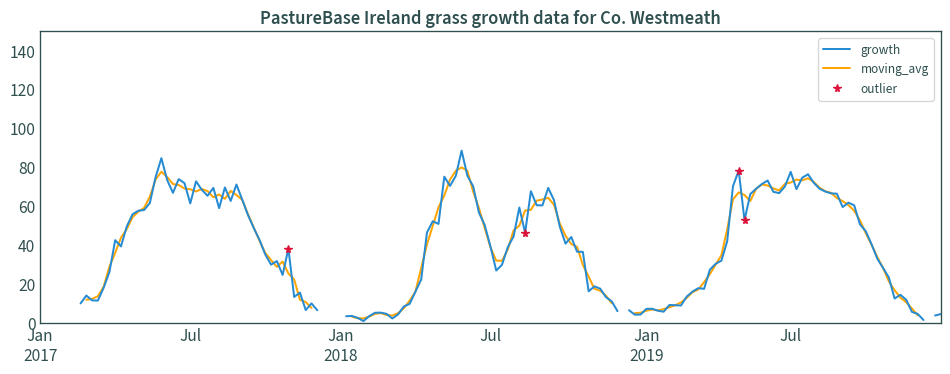

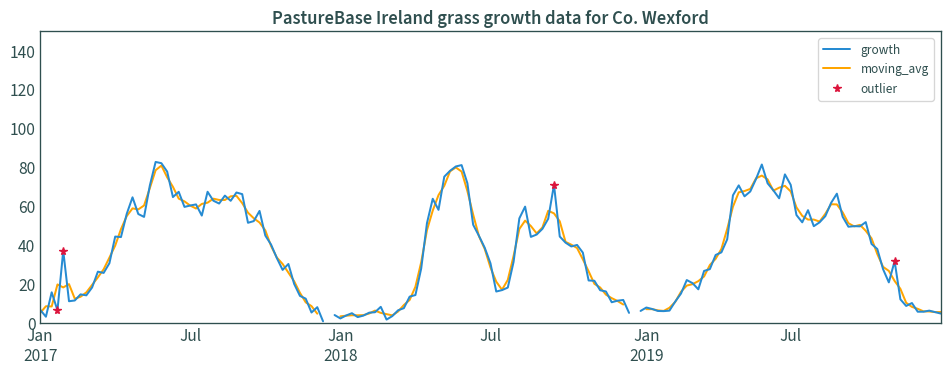

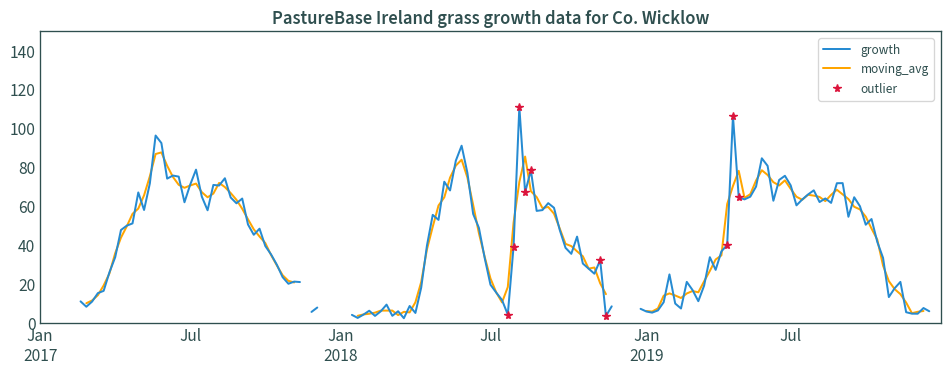

In [41]:
for county in counties:
    axs = grass_out.loc["2017":"2019"].plot(
        ylim=[0.0, 150.0],
        figsize=(12, 8), y=county, label="growth"
    )
    grass_out.loc["2017":"2019"].plot(
        figsize=(10, 4), y=f"{county}_mn", ax=axs, label="moving_avg",
        color="orange", zorder=1
    )
    if True in list(grass_out[f"{county}_outlier"].loc["2017":"2019"].unique()):
        grass_out[grass_out[f"{county}_outlier"] == True].loc["2017":"2019"].plot(
            ax=axs, linewidth=0.0, marker="*", y=county, label="outlier",
            color="crimson"
        )
    plt.title(f"PastureBase Ireland grass growth data for Co. {county}")
    plt.xlabel("")
    plt.tight_layout()
    plt.show()

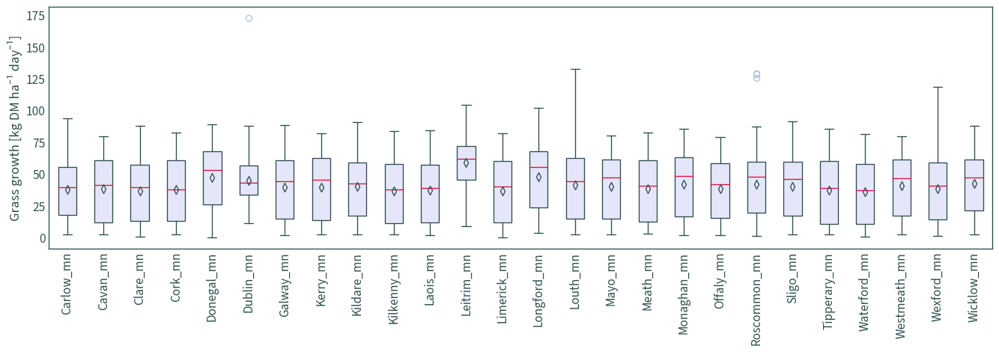

In [42]:
# with outliers
grass_out[[f"{county}_mn" for county in counties]].plot.box(
    figsize=(14, 5), showmeans=True, patch_artist=True,
    color={
        "medians": "Crimson",
        "whiskers": "DarkSlateGrey",
        "caps": "DarkSlateGrey"
    },
    boxprops={"facecolor": "Lavender", "color": "DarkSlateGrey"},
    meanprops={
        "markeredgecolor": "DarkSlateGrey",
        "marker": "d",
        "markerfacecolor": (1, 1, 0, 0)  # transparent
    },
    flierprops={"markeredgecolor": "LightSteelBlue", "zorder": 1}
)
plt.xticks(rotation="vertical")
plt.ylabel("Grass growth [kg DM ha⁻¹ day⁻¹]")
plt.tight_layout()
# plt.savefig(os.path.join("data", "grass_growth", "pasturebase", "boxplot_outliers.png"))
plt.show()